<a href="https://colab.research.google.com/github/RezaBahani/IUTComputationalPhysics/blob/main/fourierTrans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# System first condition

import numpy as np

sigma = 10 # set Δx value (σ = 0.1)
p0 = 20 # set initial momentum value
x0 = 0 # set initial position value (x0 = 0)
N = 20000 # set number of points (N = 2000)
L = 100*sigma # set length of the box (L = 100σ)
hbar = 1 # set Planck's constant (ℏ = 1)

x = np.linspace(-L/2 , L/2 , N) # create x array
psi0 = np.exp( -(x-x0)**2 / (4*sigma**2) ) * np.exp(p0*x*1j/hbar) / np.sqrt( np.sqrt(2*np.pi)*sigma)

integral of |psi0|^2 =1.000
average of x =-0.000
standard deviation of x =10.000
average of p =16.83
standard deviation of p =0.03
undertainty principle σxσp=0.27


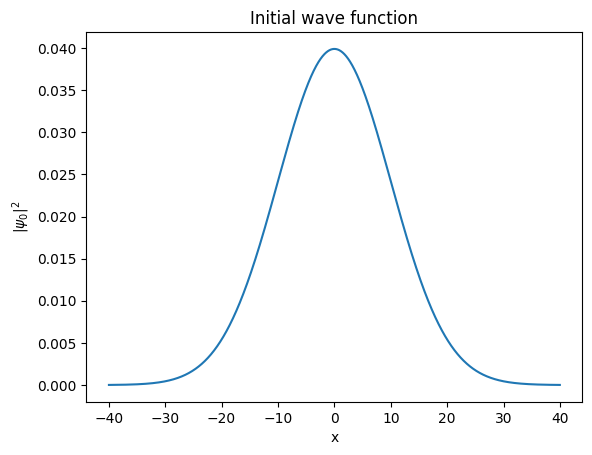

In [2]:
# calculate the normalization of the psi0
dx = x[1] - x[0]
integral = np.sum(np.abs(psi0)**2) * dx
print(f'integral of |psi0|^2 ={integral:.3f}')

#average and standard deviation of position
avg_x = np.sum(np.abs(psi0)**2 * x) * dx
std_x = np.sqrt( np.sum(np.abs(psi0)**2 * (x-avg_x)**2) * dx )
print(f"average of x ={avg_x:.3f}")
print(f"standard deviation of x ={std_x:.3f}")

# average and standard deviation of momentum
avg_p = np.sum(np.conj(psi0) * (-1j*hbar*np.gradient(psi0,x)) ) * dx
std_p = np.sqrt( np.sum(np.conj(psi0) * (-1*hbar*hbar*np.gradient(np.gradient(psi0,x) , x) ))  * dx  - avg_p**2 )
print(f"average of p ={np.real(avg_p):.2f}")
print(f"standard deviation of p ={np.real(std_p):.2f}")
print(f"undertainty principle σxσp={np.real(std_p*std_x):.2f}")

# plot the wave function
import matplotlib.pyplot as plt
range_of_interest_x = np.abs(x-x0)< 4*sigma # range of interest in x space, where the wave function is significant : 4σ around x0
plt.plot(x[ range_of_interest_x ], np.abs(psi0[range_of_interest_x ])**2)
plt.xlabel('x')
plt.ylabel('$|\psi_0|^2$')
plt.title('Initial wave function')
plt.show()

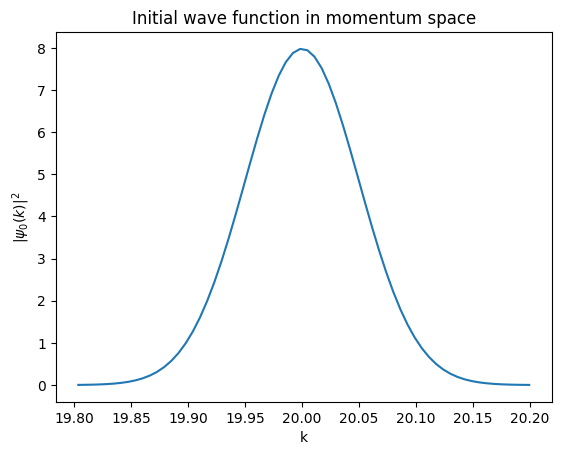

size of psi0_k =1.000
average of k =20.000
standard deviation of k =0.050


In [3]:
psi0_k = np.fft.fftshift(np.fft.fft(psi0)) * dx / np.sqrt(2*np.pi) # Fourier transform of psi0
k = np.fft.fftshift(np.fft.fftfreq(N)) *2*np.pi / (dx)
dk = k[1] - k[0]
sigma_p = hbar/(2*sigma)
range_of_interest_p = np.abs(k-p0)<4*sigma_p # range of interest in momentum space, a window of 4σ_p around p0
plt.plot(k[range_of_interest_p], np.abs(psi0_k[range_of_interest_p])**2 )
plt.xlabel('k')
plt.ylabel('$|\psi_0(k)|^2$')
plt.title('Initial wave function in momentum space')
plt.show()

# calculate the average and standard deviation of momentum in momentum space
size_k = np.sum(np.abs(psi0_k)**2) * dk

avg_k = np.sum(np.abs(psi0_k)**2 * k) * dk
std_k = np.sqrt( np.sum(np.abs(psi0_k)**2 * (k-avg_k)**2) * dk )

print(f"size of psi0_k ={size_k:.3f}")
print(f"average of k ={avg_k:.3f}")
print(f"standard deviation of k ={std_k:.3f}")

In [4]:
import tqdm
# implement the time evolution in momentum space
m = 0.001 # set mass (m = 1)

dt = 0.0005 # set time step (dt = 1)
t = 0 # set initial time (t = 0)
T = 5 # set total time (T = 1000)
Nt = int(T/dt) # calculate the number of time steps

times_to_plot = []
states_to_plot_x = []
states_to_plot_k = []

x_avgs = []
x_stds = []
normalizations = []

p_avgs = []
p_stds = []


psi_k = psi0_k # set the initial wave function in momentum space
psi_k /= np.sqrt(size_k) # normalize the wave function in momentum space

times_to_plot.append(0)
states_to_plot_x.append(psi0)
states_to_plot_k.append(psi0_k)
x_avgs.append( np.sum(np.abs(psi0)**2 * x) * dx )
x_stds.append( np.sqrt( np.sum(np.abs(psi0)**2 * (x-x_avgs[-1])**2) * dx ) )

for i in tqdm.tqdm(range(Nt)):
    psi_k *= np.exp(-1j * hbar * k*k * dt / (2 * m))   # Apply kinetic energy operator correctly
    #psi_k -= psi_k * ( 1j * hbar * k*k * dt  / (2*m) ) # apply the kinetic energy operator
    #psi_k = psi_k / np.sqrt(size_k) # normalize the wave function in momentum space

    p_avgs.append( np.sum(np.abs(psi_k)**2 * k) * dk )
    p_stds.append( np.sqrt( np.sum(np.abs(psi_k)**2 * (k-p_avgs[-1])**2) * dk ) )

    if i % 20 == 0: # plot the wave function every 100 time steps
        psi = np.fft.ifft( np.fft.ifftshift( psi_k) ) * dk / np.sqrt(2*np.pi) # inverse Fourier transform of psi_k
        psi /= np.sqrt( np.sum(np.abs(psi)**2) * dx )

        times_to_plot.append(t)
        states_to_plot_x.append(psi)
        states_to_plot_k.append(psi_k)

        x_avgs.append( np.sum(np.abs(psi)**2 * x) * dx )
        x_stds.append( np.sqrt( np.sum(np.abs(psi)**2 * (x-x_avgs[-1])**2) * dx ) )

    t += dt # update the time


100%|██████████| 10000/10000 [00:30<00:00, 330.07it/s]


In [5]:
import matplotlib.animation as animation
from IPython.display import HTML

ims = []
fig = plt.figure()

for state in tqdm.tqdm(states_to_plot_x):
    im = plt.plot(x , np.abs( state )**2 , animated=True)
    ims.append( im )

ani = animation.ArtistAnimation(fig, ims, interval=500, blit=True,
                                repeat_delay=1000)
output = HTML(ani.to_jshtml())
plt.close()
output

100%|██████████| 501/501 [00:01<00:00, 445.47it/s]


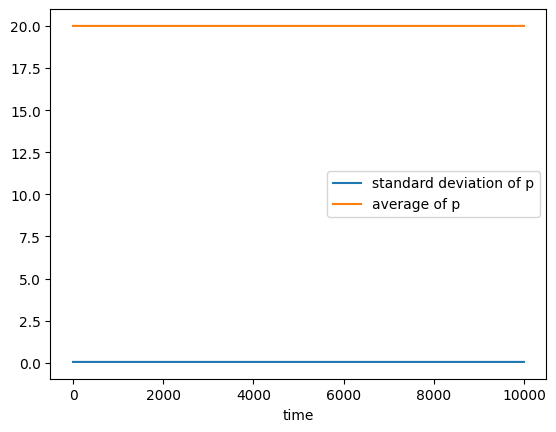

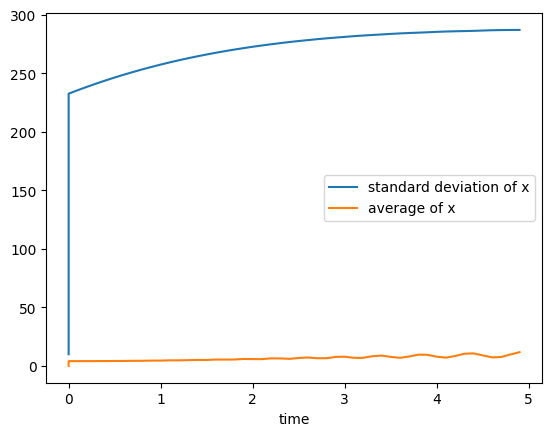

In [ ]:
plt.plot(list(range(len(p_stds))), p_stds , label='standard deviation of p')
plt.plot(list(range(Nt)), p_avgs , label='average of p')
plt.xlabel('time')

plt.legend()
plt.show()

plt.plot(times_to_plot, x_stds , label='standard deviation of x')
plt.plot(times_to_plot, x_avgs , label='average of x')
plt.xlabel('time')
plt.legend()
plt.show()

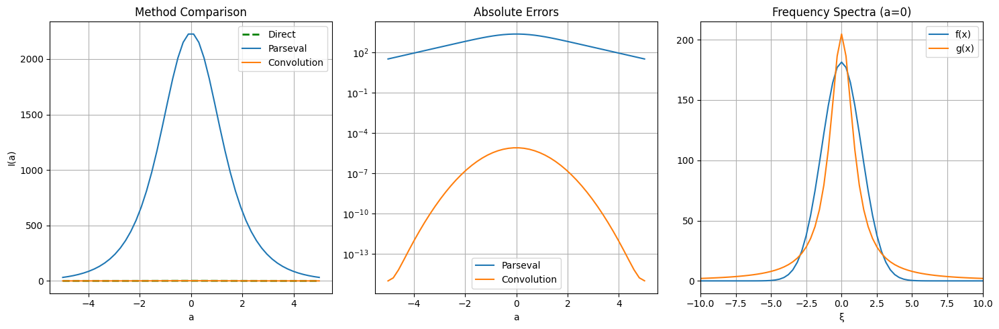

Parseval Max Error: 2.22e+03
Convolution Max Error: 7.87e-06


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, ifft, fftshift, fftfreq
from scipy.integrate import quad

# Define the functions
def f(x, a=0):
  return np.exp(-(x-a)**2)
def g(x):
  return np.exp(-abs(x))

# Parameters
x_range, N = 10, 2048
a_values = np.linspace(-5, 5, 50)
x = np.linspace(-x_range, x_range, N)
dx = x[1] - x[0]

# Method 1: Parseval's Theorem (Fourier)
def integral_parseval(a):
    F_f = fft(f(x,a)) * dx/np.sqrt(2*np.pi)
    F_g = fft(g(x)) * dx/np.sqrt(2*np.pi)
    return np.sum(F_f * np.conj(F_g)).real * (2*np.pi)/dx

# Method 2: Convolution Theorem
def integral_convolution(a):
    conv = np.convolve(f(x,a), g(x), 'same') * dx
    return conv[N//2]

# Method 3: Direct Integration (Reference)
def integral_direct(a):
    integrand = lambda x: f(x,a)*g(x)
    return quad(integrand, -np.inf, np.inf)[0]

# Compute results
methods = {
    "Direct": [integral_direct(a) for a in a_values],
    "Parseval": [integral_parseval(a) for a in a_values],
    "Convolution": [integral_convolution(a) for a in a_values]
}

# Plot results
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)

for name, results in methods.items():
       if name == "Direct":
           plt.plot(a_values, results, label=name, linestyle='--', color = 'green', linewidth=2) # Dashed line, thicker
       else:
           plt.plot(a_values, results, label=name)

plt.title("Method Comparison"), plt.xlabel("a"), plt.ylabel("I(a)"), plt.legend(), plt.grid()

plt.subplot(1,3,2)
errors = {name: np.abs(np.array(results) - np.array(methods["Direct"])) for name, results in methods.items()}
for name, err in errors.items():
    if name != "Direct": plt.plot(a_values, err, label=name)
plt.title("Absolute Errors"), plt.xlabel("a"), plt.legend(), plt.grid(), plt.yscale('log')

plt.subplot(1,3,3)
xi = fftfreq(N, dx/(2*np.pi))
plt.plot(fftshift(xi), fftshift(np.abs(fft(f(x,0)))), label='f(x)')
plt.plot(fftshift(xi), fftshift(np.abs(fft(g(x)))), label='g(x)')
plt.title("Frequency Spectra (a=0)"), plt.xlabel("ξ"), plt.xlim(-10,10), plt.legend(), plt.grid()

plt.tight_layout()
plt.show()

# Print error statistics
for name in ["Parseval", "Convolution"]:
    print(f"{name} Max Error: {np.max(errors[name]):.2e}")